In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [6]:
!pip uninstall opencv-python opencv-contrib-python -y

Found existing installation: opencv-contrib-python 4.8.0.74
Uninstalling opencv-contrib-python-4.8.0.74:
  Successfully uninstalled opencv-contrib-python-4.8.0.74


In [7]:
!pip install opencv-contrib-python

  Using cached opencv_contrib_python-4.8.0.74-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (67.8 MB)


In [8]:
import cv2
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm

In [8]:
path = '/kaggle/input/crop-and-weed-detection-data-with-bounding-boxes/agri_data/data/'

In [9]:
data = [os.path.join(path,x) for x in os.listdir(path)]

In [10]:
images = [data[x] for x in range(len(data)) if data[x].endswith('.jpeg')]

In [11]:
labels = [data[x] for x in range(len(data)) if data[x].endswith('.txt')]

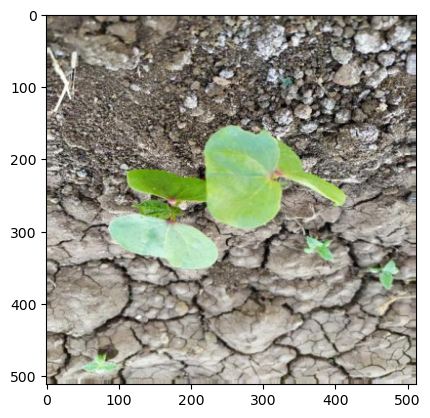

In [12]:
plt.imshow(cv2.cvtColor(cv2.imread(images[0]),cv2.COLOR_BGR2RGB))

In [13]:
df = pd.DataFrame(columns=['image_name','object','x_cen','y_cen','w','h'])
i=0
for id in tqdm(images):
    label = open(id[:-5]+'.txt','r') 
    a = label.read()
    label.close()
    label = a.split('\n')
    cleaned_label = label[:-1]
    
    for name in cleaned_label:
        ind_label = name.split(' ')
        df.loc[i,'image_name'] = id[78:]
        df.loc[i,'object'] = int(ind_label[0])
        df.loc[i,'x_cen'] = float(ind_label[1])
        df.loc[i,'y_cen'] = float(ind_label[2])
        df.loc[i,'w'] = float(ind_label[3])
        df.loc[i,'h'] = float(ind_label[4])
        i += 1

100%|██████████| 1300/1300 [00:24<00:00, 53.31it/s]


In [14]:
df.head()

,image_name,object,x_cen,y_cen,w,h
0,agri_0_7209.jpeg,1,0.492188,0.504883,0.683594,0.419922
1,agri_0_6978.jpeg,0,0.514648,0.5,0.724609,0.859375
2,agri_0_9299.jpeg,0,0.491211,0.394531,0.892578,0.523438
3,agri_0_8085.jpeg,0,0.515625,0.530273,0.710938,0.580078
4,agri_0_8482.jpeg,0,0.445312,0.53125,0.785156,0.753906


In [15]:
column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
pascal_voc = pd.DataFrame(columns=column_name)
for i in tqdm(range(len(df))):
    
    pascal_voc.loc[i,'filename'] = df.loc[i,'image_name']
    pascal_voc.loc[i,'width'] = 512
    pascal_voc.loc[i,'height']= 512  
    if df.loc[i,'object'] == 0:    
        pascal_voc.loc[i,'class'] = 'crop'
    else:
        pascal_voc.loc[i,'class'] = 'weed'
    pascal_voc.loc[i,'xmin']  = int((df.loc[i,'x_cen'] - df.loc[i,'w']/2)*512)
    pascal_voc.loc[i,'ymin']  = int((df.loc[i,'y_cen'] - df.loc[i,'h']/2)*512)
    pascal_voc.loc[i,'xmax']  = int((df.loc[i,'x_cen'] + df.loc[i,'w']/2)*512)
    pascal_voc.loc[i,'ymax']  = int((df.loc[i,'y_cen'] + df.loc[i,'h']/2)*512) 

100%|██████████| 2072/2072 [00:02<00:00, 899.28it/s]


In [16]:
pascal_voc

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_7209.jpeg,512,512,weed,77,151,427,366
1,agri_0_6978.jpeg,512,512,crop,77,36,448,476
2,agri_0_9299.jpeg,512,512,crop,23,67,480,336
3,agri_0_8085.jpeg,512,512,crop,81,122,446,419
4,agri_0_8482.jpeg,512,512,crop,26,79,428,464
...,...,...,...,...,...,...,...,...
2067,agri_0_6270.jpeg,512,512,crop,90,53,460,350
2068,agri_0_6523.jpeg,512,512,crop,93,127,411,418
2069,agri_0_270.jpeg,512,512,weed,54,124,405,476
2070,agri_0_2332.jpeg,512,512,crop,27,34,489,404


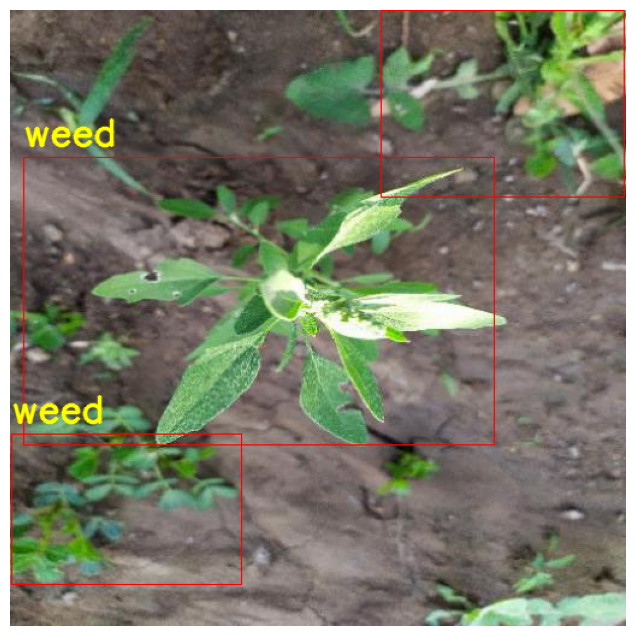

In [17]:
any_index_number = 55 #change this number for different images
test_img = cv2.cvtColor(cv2.imread(path+pascal_voc.loc[any_index_number,'filename']),cv2.COLOR_BGR2RGB)
test_df = pascal_voc[pascal_voc['filename']==pascal_voc.loc[any_index_number,'filename']].reset_index(drop=True)
for i in range(len(test_df)):
    
    rec = cv2.rectangle(test_img, (test_df.loc[i,'xmin'],test_df.loc[i,'ymin']), (test_df.loc[i,'xmax'],test_df.loc[i,'ymax']), (255,0,0), 1, 1) 
    text = cv2.putText(rec, test_df.loc[i,'class'], (test_df.loc[i,'xmin'],test_df.loc[i,'ymin']-10), cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,0), 2, cv2.LINE_AA)
    
plt.figure(figsize=(8,8))    
plt.imshow(text)
plt.axis('off')
plt.show()

In [18]:
pascal_voc.to_csv('pascal_voc_format.csv',index=False)

# **Data Preparation**

In [19]:
path = '/kaggle/input/crop-and-weed-detection-data-with-bounding-boxes/agri_data/data/'

In [20]:
df = pd.read_csv('/kaggle/working/pascal_voc_format.csv')

In [21]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_7209.jpeg,512,512,weed,77,151,427,366
1,agri_0_6978.jpeg,512,512,crop,77,36,448,476
2,agri_0_9299.jpeg,512,512,crop,23,67,480,336
3,agri_0_8085.jpeg,512,512,crop,81,122,446,419
4,agri_0_8482.jpeg,512,512,crop,26,79,428,464


In [22]:
folder_images = os.listdir(path)

In [23]:
folder_images = [folder_images[x] for x in range(len(folder_images)) if folder_images[x].endswith('.jpeg')]

In [24]:
len(folder_images)

1300

In [25]:
folder_images

['agri_0_7209.jpeg',
 'agri_0_6978.jpeg',
 'agri_0_9299.jpeg',
 'agri_0_8085.jpeg',
 'agri_0_8482.jpeg',
 'agri_0_9584.jpeg',
 'agri_0_9927.jpeg',
 'agri_0_3398.jpeg',
 'agri_0_7362.jpeg',
 'agri_0_8682.jpeg',
 'agri_0_82.jpeg',
 'agri_0_6222.jpeg',
 'agri_0_2469.jpeg',
 'agri_0_4383.jpeg',
 'agri_0_4718.jpeg',
 'agri_0_8209.jpeg',
 'agri_0_84.jpeg',
 'agri_0_1317.jpeg',
 'agri_0_3442.jpeg',
 'agri_0_4789.jpeg',
 'agri_0_7039.jpeg',
 'agri_0_7204.jpeg',
 'agri_0_5494.jpeg',
 'agri_0_3880.jpeg',
 'agri_0_9526.jpeg',
 'agri_0_9773.jpeg',
 'agri_0_4240.jpeg',
 'agri_0_402.jpeg',
 'agri_0_203.jpeg',
 'agri_0_8959.jpeg',
 'agri_0_7550.jpeg',
 'agri_0_5706.jpeg',
 'agri_0_8800.jpeg',
 'agri_0_9696.jpeg',
 'agri_0_3971.jpeg',
 'agri_0_4058.jpeg',
 'agri_0_2407.jpeg',
 'agri_0_4530.jpeg',
 'agri_0_667.jpeg',
 'agri_0_2999.jpeg',
 'agri_0_3828.jpeg',
 'agri_0_1028.jpeg',
 'agri_0_1590.jpeg',
 'agri_0_9707.jpeg',
 'agri_0_8663.jpeg',
 'agri_0_6469.jpeg',
 'agri_0_8440.jpeg',
 'agri_0_4033.jpeg',

In [26]:
train_images = folder_images[:1000]
test_images = folder_images[1000:]

In [27]:
j=0
for i in tqdm(list(df['filename'].unique())):
    if i in folder_images:
        j+=1
print(j)  

100%|██████████| 1300/1300 [00:00<00:00, 44340.14it/s]

1300


# **Visualizing the Dataset**

16it [00:00, 59.23it/s]


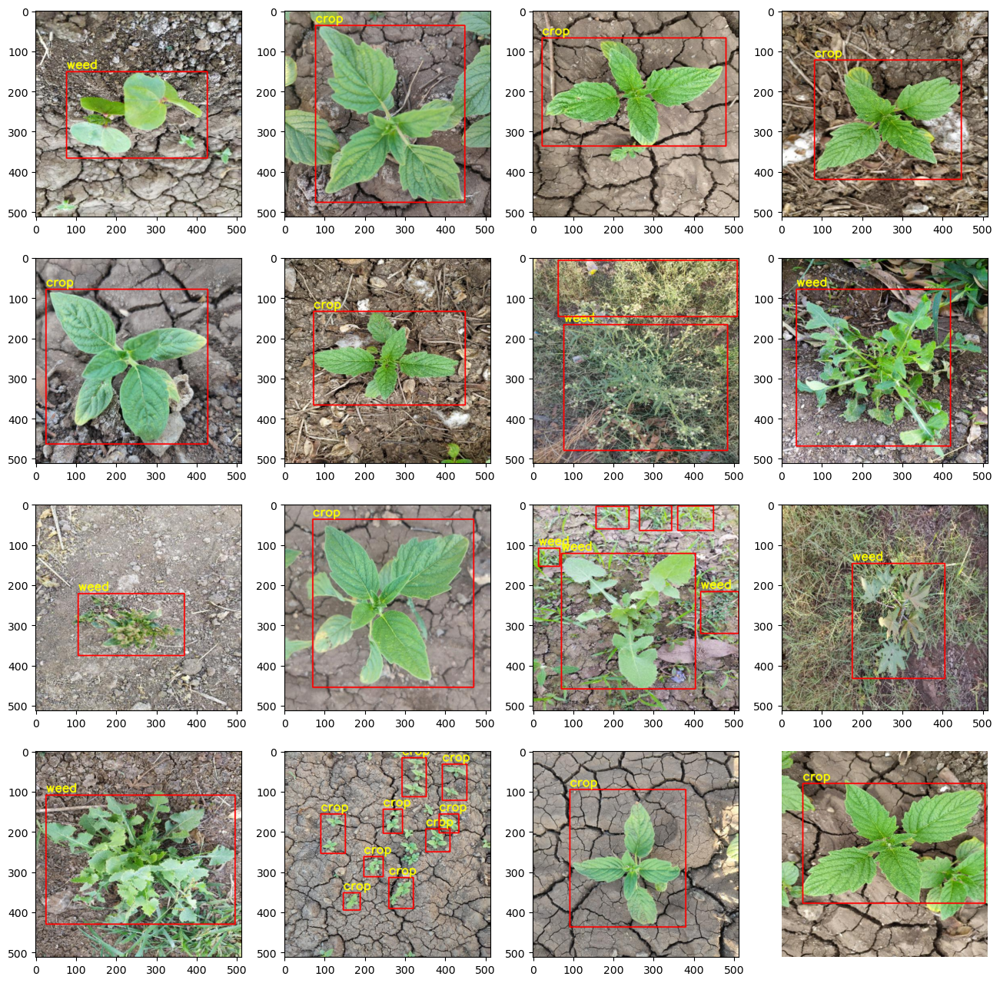

In [28]:
_ , axes = plt.subplots(4,4,figsize=(16,16))
for i,ax in tqdm(zip(range(16),axes.flat)):
    temp_df = df[df['filename']==folder_images[i]].reset_index(drop=True)
    temp_img = cv2.imread(path+folder_images[i])
    temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
    for j in range(len(temp_df)):
        rect = cv2.rectangle(temp_img,(temp_df.loc[j,'xmin'],temp_df.loc[j,'ymin']),(temp_df.loc[j,'xmax'],temp_df.loc[j,'ymax']),(255,0,0),2,cv2.LINE_AA)
        rect_text = cv2.putText(rect,temp_df.loc[j,'class'],(temp_df.loc[j,'xmin'],temp_df.loc[j,'ymin']-8), cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,0), 2, cv2.LINE_AA)
    ax.imshow(rect_text)
    plt.axis('off')

# **Image preproccesing Done on Local Script**

In [29]:
import json

In [21]:
train_json = '/kaggle/input/region-proposals-of-crop-weed-dataset/train.json'
test_json = '/kaggle/input/region-proposals-of-crop-weed-dataset/test.json'
images_path = '/kaggle/input/crop-and-weed-detection-data-with-bounding-boxes/agri_data/data/'

In [31]:
with open(train_json,'r') as train:
    train_data = json.load(train)

In [32]:
with open(test_json,'r') as test:
    test_data = json.load(test)

In [33]:
train_images_list = list(train_data.keys())
test_images_list =list(test_data.keys())

In [34]:
os.mkdir('Train')
os.mkdir('Test')

FileExistsError: [Errno 17] File exists: 'Train'

In [35]:
os.mkdir('Train/weed')
os.mkdir('Train/crop')
os.mkdir('Train/background')

os.mkdir('Test/weed')
os.mkdir('Test/crop')
os.mkdir('Test/background')

FileExistsError: [Errno 17] File exists: 'Train/weed'

In [36]:
for count,img_id in tqdm(enumerate(train_images_list)):
    img = cv2.imread(images_path + img_id)
    
    
    for proposal in train_data[img_id]['region_proposal']:
        x,y,w,h = proposal[0]
        label   = proposal[1]
         
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Train/'+label+'/'+ label+'_'+ str(len(os.listdir('Train/'+label))) +'.jpeg',temp_img)
        
    
    for background in train_data[img_id]['negative_example']:
        x,y,w,h = background
        label = 'background'
        
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Train/'+label+'/'+ label+'_'+ str(len(os.listdir('Train/'+label))) + '.jpeg',temp_img)


319it [06:02,  1.14s/it]


KeyboardInterrupt: 

In [37]:
for count,img_id in tqdm(enumerate(test_images_list)):
    img = cv2.imread(images_path + img_id)
    
    
    for proposal in test_data[img_id]['region_proposal']:
        x,y,w,h = proposal[0]
        label   = proposal[1]
         
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Test/'+label+'/'+ label+'_'+ str(len(os.listdir('Test/'+label))) +'.jpeg',temp_img)
        
    
    for background in test_data[img_id]['negative_example']:
        x,y,w,h = background
        label = 'background'
        
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Test/'+label+'/'+ label+'_'+ str(len(os.listdir('Test/'+label))) + '.jpeg',temp_img)


12it [00:03,  3.02it/s]


KeyboardInterrupt: 

In [ ]:
print('Total training weed images are {}'.format(len(os.listdir('Train/weed'))))
print('Total training crop images are {}'.format(len(os.listdir('Train/crop'))))
print('Total training background images are {}'.format(len(os.listdir('Train/background'))))

In [ ]:
print('Total testing weed images are {}'.format(len(os.listdir('Test/weed'))))
print('Total testing crop images are {}'.format(len(os.listdir('Test/crop'))))
print('Total testing background images are {}'.format(len(os.listdir('Test/background'))))

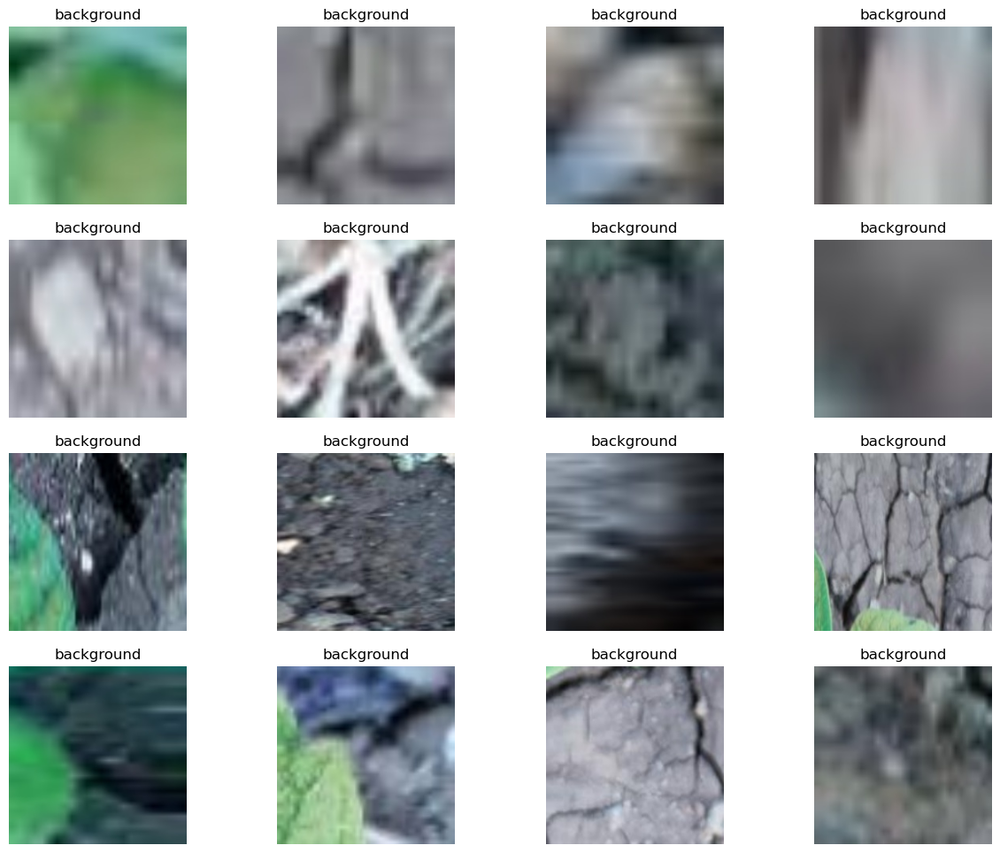

In [39]:
plt.figure(figsize=(15,12))
for i,img in enumerate(os.listdir('Train/background')[:16]):
    plt.subplot(4,4,i+1)
    plt.title('background')
    img = cv2.imread('Train/background/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')

plt.show()  

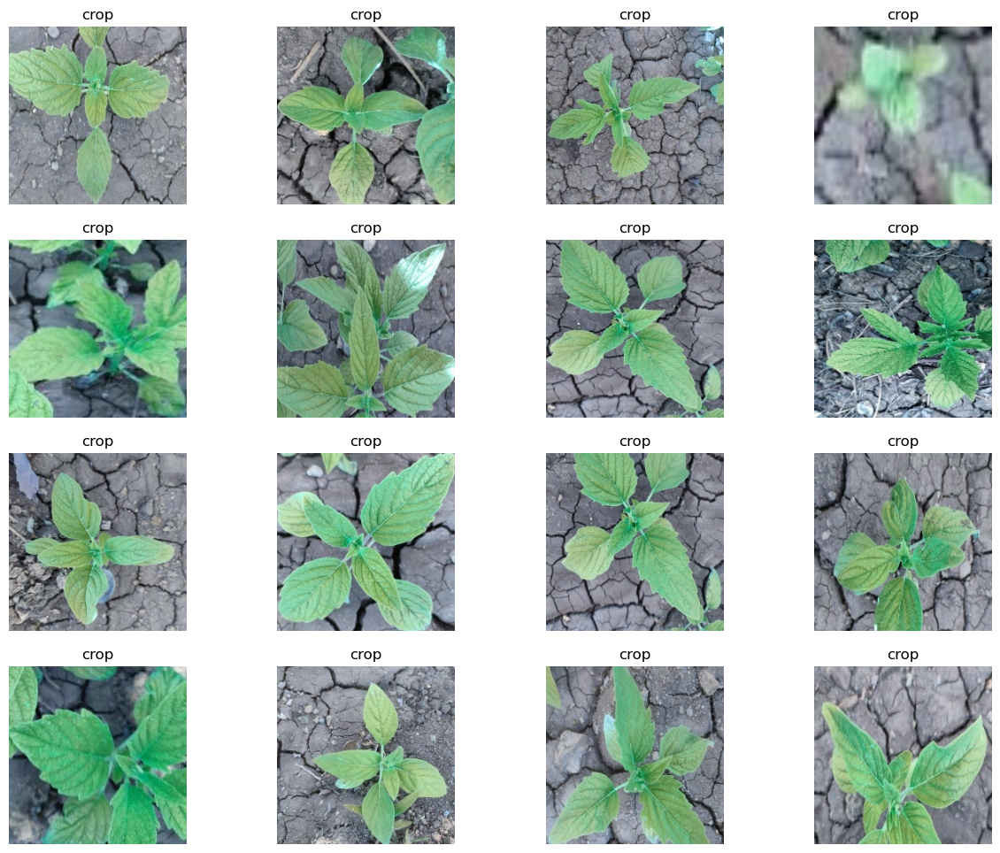

In [38]:
plt.figure(figsize=(15,12))
for i,img in enumerate(os.listdir('Train/crop')[0:16]):
    plt.subplot(4,4,i+1)
    plt.title('crop')
    img = cv2.imread('Train/crop/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')

plt.show()

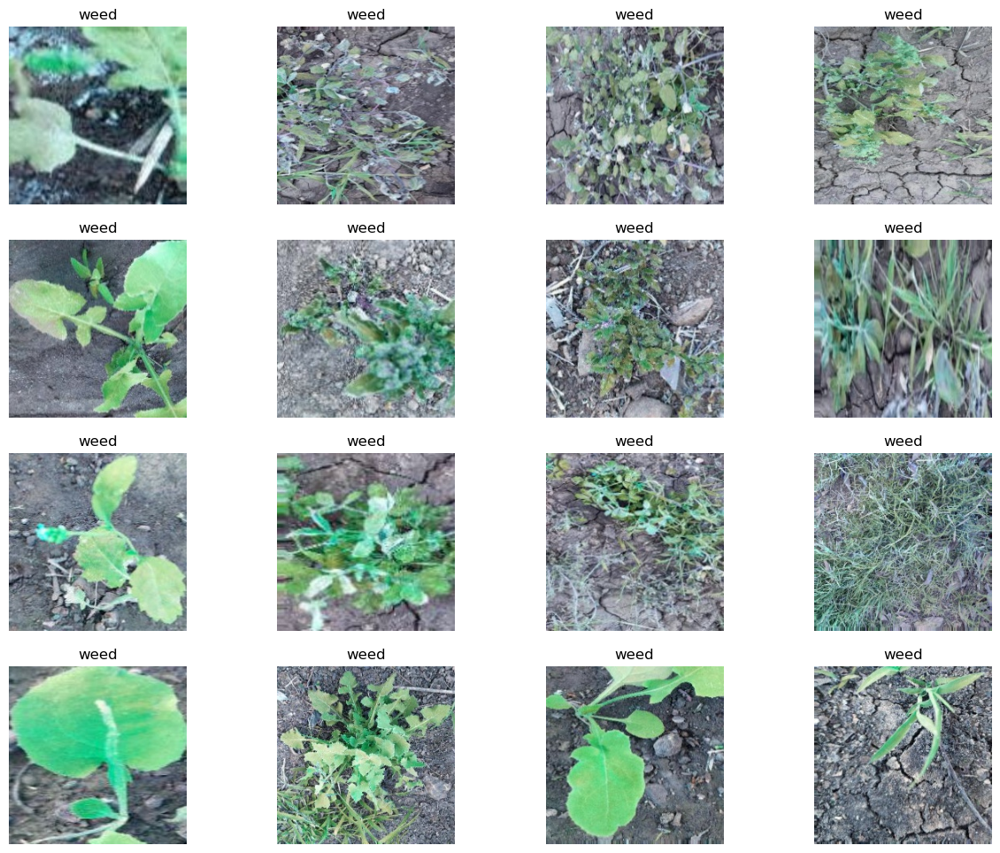

In [40]:
plt.figure(figsize=(15,12))

for i,img in enumerate(os.listdir('Train/weed')[0:16]):
    plt.subplot(4,4,i+1)
    plt.title('weed')
    img = cv2.imread('Train/weed/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
plt.show()    

# **Fine Tunning**

In [ ]:
train_path = '/kaggle/working/Train'
test_path = '/kaggle/working/Test'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
BATCH_SIZE = 64
IMAGE_SIZE = (224,224,3)

In [ ]:
train_generator = ImageDataGenerator(rescale=1./255,validation_split=0.2)

train_data = train_generator.flow_from_directory(train_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 subset='training')

val_data = train_generator.flow_from_directory(train_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=False,
                                                 subset='validation')

test_generator  = ImageDataGenerator(rescale=1./255)
test_data = test_generator.flow_from_directory(test_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",shuffle=False,
                                                 batch_size=BATCH_SIZE)

# **Model Architecture**

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense,Flatten,Input,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
tensorflow.keras.utils.disable_interactive_logging()

In [ ]:
baseModel = VGG16(weights="imagenet", include_top=False,
    input_tensor=Input(shape=IMAGE_SIZE))

headModel = baseModel.output
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(4096, activation='relu')(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(4096, activation='relu')(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(3, activation='softmax')(headModel)

for layer in baseModel.layers:
    layer.trainable = False

model = Model(inputs=baseModel.input, outputs=headModel)

opt = Adam(lr=0.001)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

In [ ]:
model.summary()

In [ ]:
early_stop = EarlyStopping(patience=2,monitor='val_loss')

In [ ]:
results = model.fit_generator(train_data,epochs=20,
                              validation_data=val_data,
                             callbacks=[early_stop])

In [47]:
pd.DataFrame(model.history.history)[['accuracy','val_accuracy']].plot()

AttributeError: 'NoneType' object has no attribute 'history'

In [ ]:
pd.DataFrame(model.history.history)[['loss','val_loss']].plot()

In [48]:
test_pred = model.predict_generator(test_data)

/tmp/ipykernel_28/2732937700.py:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  test_pred = model.predict_generator(test_data)


ValueError: Failed to find data adapter that can handle input: (<class 'dict'> containing {"<class 'str'>"} keys and {'(<class \'dict\'> containing {"<class \'str\'>"} keys and {\'(<class \\\'list\\\'> containing values of types {\\\'(<class \\\\\\\'list\\\\\\\'> containing values of types {\\\\\\\'(<class \\\\\\\\\\\\\\\'list\\\\\\\\\\\\\\\'> containing values of types {"<class \\\\\\\\\\\\\\\'int\\\\\\\\\\\\\\\'>"})\\\\\\\', "<class \\\\\\\'str\\\\\\\'>"})\\\'})\', \'(<class \\\'list\\\'> containing values of types {\\\'(<class \\\\\\\'list\\\\\\\'> containing values of types {"<class \\\\\\\'int\\\\\\\'>"})\\\'})\'} values)', '(<class \'dict\'> containing {"<class \'str\'>"} keys and {"(<class \'list\'> containing values of types set())"} values)'} values), <class 'NoneType'>

In [ ]:
pred_class = [np.argmax(x) for x in test_pred]

In [ ]:
test_data.class_indices

In [ ]:
true_class = test_data.classes

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(true_class,pred_class))

In [ ]:
import seaborn as sns

In [ ]:
sns.heatmap(confusion_matrix(true_class,pred_class),annot=True)

In [ ]:
mapping_class = test_data.class_indices

In [ ]:
mapping_class = dict([(value, key) for key, value in mapping_class.items()]) 

In [ ]:
images, labels = next(iter(test_data))
images = images.reshape(64, 224,224,3)
fig, axes = plt.subplots(4, 4, figsize=(16,16))

for ax, img, label in zip(axes.flat, images[:16], labels[:16]):
    ax.imshow(img)
    true_label = mapping_class[np.argmax(label)]
    
    pred_prob = model.predict(img.reshape(1, 224,224, 3))
    pred_label = mapping_class[np.argmax(pred_prob)]
    
    prob_class = np.max(pred_prob) * 100
    
    ax.set_title(f"TRUE LABEL: {true_label}", fontweight = "bold", fontsize = 12)
    ax.set_xlabel(f"PREDICTED LABEL: {pred_label}\nProb({pred_label}) = {(prob_class):.2f}%",
                 fontweight = "bold", fontsize = 10,
                 color = "blue" if true_label == pred_label else "red")
    
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
fig.suptitle("PREDICTION for 16 RANDOM TEST IMAGES", size = 30, y = 1.03, fontweight = "bold")
plt.show()

In [ ]:
misclassify_pred = np.nonzero(true_class != pred_class)[0]
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for ax, batch_num, image_num in zip(axes.flat, misclassify_pred // BATCH_SIZE, misclassify_pred % BATCH_SIZE):
    images, labels = test_data[batch_num]
    img = images[image_num]
    ax.imshow(img.reshape(*IMAGE_SIZE))
    
    true_label = mapping_class[np.argmax(label)]
    
    pred_prob = model.predict(img.reshape(1, 224,224, 3))
    pred_label = mapping_class[np.argmax(pred_prob)]
    
    prob_class = np.max(pred_prob)*100
    
    
    ax.set_title(f"TRUE LABEL: {true_label}", fontweight = "bold", fontsize = 12)
    ax.set_xlabel(f"PREDICTED LABEL: {pred_label}\nProb({pred_label}) = {(prob_class):.2f}%",
                 fontweight = "bold", fontsize = 10,
                 color = "blue" if true_label == pred_label else "red")
    
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
fig.suptitle(f"MISCLASSIFIED TEST IMAGES ({len(misclassify_pred)} out of {len(true_class)})",
             size = 20, y = 1.03, fontweight = "bold")
plt.show()

In [ ]:
model.save('RCNN_crop_weed_classification_model.h5')

# **SVM Model**

In [49]:
model_path  = '/kaggle/working/RCNN_crop_weed_classification_model.h5'
label_csv = '/kaggle/working/pascal_voc_format.csv'
negative_ex_path = '/kaggle/working/Train/background/'

In [50]:
with open(train_json,'r') as train:
    train_region = json.load(train)
with open(test_json,'r') as test:
    test_region = json.load(test)
train_images_list = list(train_region.keys())
test_images_list = list(test_region.keys())
print(len(train_images_list))
print(len(test_images_list))

1000
300


In [51]:
labels = pd.read_csv(label_csv)
labels.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_7209.jpeg,512,512,weed,77,151,427,366
1,agri_0_6978.jpeg,512,512,crop,77,36,448,476
2,agri_0_9299.jpeg,512,512,crop,23,67,480,336
3,agri_0_8085.jpeg,512,512,crop,81,122,446,419
4,agri_0_8482.jpeg,512,512,crop,26,79,428,464


In [52]:
model = tf.keras.models.load_model(model_path)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [53]:
model_without_last_2FC = tf.keras.models.Model(model.inputs,model.layers[-5].output)

In [24]:
import tqdm.notebook as tq

In [56]:
train_features = []

test_features = []


for index in tq.tqdm(range(len(labels))):
    id = labels.loc[index,'filename']
    img = cv2.imread(images_path + id)
    rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    xmin,ymin,xmax,ymax = int(labels.loc[index,'xmin']) ,int(labels.loc[index,'ymin']),int(labels.loc[index,'xmax']),int(labels.loc[index,'ymax'])

    resized = cv2.resize(rgb_img[ymin:ymax,xmin:xmax,:],(224,224))

    feature_of_img = model_without_last_2FC.predict(resized.reshape(1,224,224,3)/255)
    
    if id in train_images_list:
        
        train_features.append([feature_of_img,labels.loc[index,'class']])
        
    else:
        test_features.append([feature_of_img,labels.loc[index,'class']])

  0%|          | 0/2072 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


In [57]:
print(len(train_features))

print(len(test_features))

1637
435


In [58]:
for index,img in tq.tqdm(enumerate(os.listdir(negative_ex_path)[:5000])):  #only extracting for 10,000 images
    img = cv2.imread(negative_ex_path + img )
    rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    #images already in (224,224,3)
    feature_of_img = model_without_last_2FC.predict(rgb.reshape(1,224,224,3)/255)
    if index<3500:
        train_features.append([feature_of_img,'background'])
    else:
        test_features.append([feature_of_img,'background'])

0it [00:00, ?it/s]

1/1 [==============================] - 0s 22ms/step


In [59]:
import random
random.shuffle(train_features)

In [60]:
X_train = np.array([x[0] for x in train_features])
X_train = X_train.reshape(-1,4096)

In [61]:
X_train.shape

(5137, 4096)

In [62]:
y_train = [x[1] for x in train_features]
y_train = np.array(y_train).reshape(-1,1)

In [63]:
y_train.shape

(5137, 1)

In [64]:
X_test = np.array([x[0] for x in test_features])
X_test = X_test.reshape(-1,4096)

In [65]:
y_test = [x[1] for x in test_features]
y_test = np.array(y_test).reshape(-1,1)

In [66]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix

In [ ]:
svm_model_linear = SVC(kernel = 'linear', C = 1,probability=True).fit(X_train, y_train) 
svm_predictions = svm_model_linear.predict(X_test)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
accuracy = svm_model_linear.score(X_test, y_test)

# **Loading Model**

In [10]:
import tensorflow as tf
tf.keras.utils.disable_interactive_logging()

In [11]:
model_path = '/kaggle/working/RCNN_crop_weed_classification_model.h5'

In [12]:
svm_model = '/kaggle/input/svmmodel/svm_model.pkl'

In [13]:
model = tf.keras.models.load_model(model_path)

In [14]:
model.summary()

In [15]:
model_without_last_two_fc = tf.keras.models.Model(model.inputs,model.layers[-5].output)
model_without_last_two_fc.summary()

In [16]:
import pickle

In [17]:
with open(svm_model,'rb') as svm:
    svm_model = pickle.load(svm)

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 0.23.1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


# **Detection**

In [18]:
def iou_calc(bb1 , bb2):
  
    true_xmin, true_ymin, true_width, true_height  = bb1
    bb_xmin, bb_ymin,  bb_width, bb_height = bb2

    true_xmax = true_xmin + true_width
    true_ymax = true_ymin + true_height
    bb_xmax = bb_xmin + bb_width
    bb_ymax = bb_ymin + bb_height

    #calculating area
    true_area = true_width * true_height
    bb_area   = bb_width * bb_height 

    #calculating itersection cordinates
    inter_xmin = max(true_xmin , bb_xmin) 
    inter_ymin = max(true_ymin , bb_ymin)
    inter_xmax = min(true_xmax , bb_xmax)
    inter_ymax = min(true_ymax , bb_ymax)

    if inter_xmax <= inter_xmin or inter_ymax <= inter_ymin:
        iou = 0


    else:
        inter_area = (inter_xmax - inter_xmin) * (inter_ymax - inter_ymin)


        iou = inter_area / (true_area + bb_area - inter_area)
        
    assert iou<=1
    assert iou>=0
    
    return iou


In [19]:
def detection(img_path,confidence=0.9,iou_thresh=0.1):
    
    # appling selective search
    img = plt.imread(img_path)
    cv2.setUseOptimized(True);
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()
    sel_rects = rects[:2000]
    
    pred_crop=[]
    pred_weed=[]
    for index, rect in tq.tqdm(enumerate(sel_rects)):

        x,y,w,h = rect
        roi = img[y:y+h,x:x+w,:]
        resized_roi = cv2.resize(roi,(224,224))/255
        
        # Feature extraction
        
        feature = model_without_last_two_fc.predict(resized_roi.reshape(-1,224,224,3))
        
        # SVM prediction
        pred = svm_model.predict_proba(feature.reshape(-1,4096))
        pred_lab=svm_model.predict(feature.reshape(-1,4096))

        if pred_lab == 'crop' and np.max(pred)>confidence:
            pred_crop.append([list(rect),np.max(pred)])
        elif pred_lab=='weed' and np.max(pred)>confidence:
            pred_weed.append([list(rect),np.max(pred)])
            
    final = []
    
    # Detection for crop class
    if len(pred_crop) != 0:
        pred_score_crop = [x[1] for x in pred_crop]
        pred_bb_crop = [x[0] for x in pred_crop]

        for i in range(len(pred_crop)):
            temp_bb , temp_score = pred_bb_crop.copy() , pred_score_crop.copy()
            if len(temp_bb) !=0:

                max_score_box = temp_bb[np.argmax(temp_score)]

                if [max_score_box,np.max(temp_score)] not in final:
                    final.append([max_score_box,np.max(temp_score),'crop'])
                    index_should_del = []

                    for ind,other_bb in enumerate(temp_bb):
                        iou_score = iou_calc(max_score_box , other_bb)
                        
                        # Non maximum suppression(nms)
                        
                        if iou_score >= iou_thresh:
                            index_should_del.append(ind)

                    pred_bb_crop    = []
                    pred_score_crop = []
                    for bb_index ,bb_value in enumerate(temp_bb) :
                        if bb_index not in index_should_del:
                            pred_bb_crop.append(bb_value)

                    for score_index ,score_value in enumerate(temp_score) :
                        if score_index not in index_should_del:
                            pred_score_crop.append(score_value)
                else:
                    continue

            else:
                break

    # Detection for weed class

    if len(pred_weed) != 0:
        pred_score_weed = [x[1] for x in pred_weed]
        pred_bb_weed = [x[0] for x in pred_weed]

        for i in range(len(pred_weed)):
            temp_bb , temp_score = pred_bb_weed.copy() , pred_score_weed.copy()
            if len(temp_bb) !=0:

                max_score_box = temp_bb[np.argmax(temp_score)]

                if [max_score_box,np.max(temp_score)] not in final:
                    final.append([max_score_box,np.max(temp_score),'weed'])
                    index_should_del = []

                    for ind,other_bb in enumerate(temp_bb):
                        iou_score = iou_calc(max_score_box , other_bb)

                        if iou_score >= iou_thresh:
                            index_should_del.append(ind)

                    pred_bb_weed    = []
                    pred_score_weed = []
                    for bb_index ,bb_value in enumerate(temp_bb) :
                        if bb_index not in index_should_del:
                            pred_bb_weed.append(bb_value)

                    for score_index ,score_value in enumerate(temp_score) :
                        if score_index not in index_should_del:
                            pred_score_weed.append(score_value)
                else:
                    continue

            else:
                break
    
   
    imOut = img.copy()
    for rect,score,cls in final:
        
        x,y,w,h = rect
        if cls == 'weed':
            color =(255,0,0)
        if cls == 'crop':
            color = (0,255,0)

        cv2.rectangle(imOut,(x,y),(x+w,y+h),color,2)

        cv2.putText(imOut,cls+':'+str(round(score*100,2)),(x,y-8),cv2.FONT_HERSHEY_SIMPLEX,1, color, 2, cv2.LINE_AA)
    plt.imshow(imOut)
    cv2.imwrite('prediction.jpeg',imOut)
   

    return final 

In [22]:
images_name = [x for x in os.listdir(images_path) if x.endswith('.jpeg')]

0it [00:00, ?it/s]

[[[327, 236, 185, 196], 0.9999998999999635, 'crop'],
 [[233, 250, 124, 133], 0.9999998999999635, 'crop'],
 [[278, 29, 179, 100], 0.9999998999999635, 'crop'],
 [[120, 375, 273, 137], 0.9999998999999635, 'crop'],
 [[22, 82, 145, 98], 0.9999998999999635, 'crop'],
 [[0, 332, 192, 117], 0.9999998999999635, 'crop'],
 [[151, 65, 206, 196], 0.9999998999999635, 'crop'],
 [[319, 197, 162, 53], 0.9999998999999635, 'crop'],
 [[499, 502, 13, 10], 0.9999999999999463, 'weed'],
 [[275, 184, 15, 15], 0.9999999999999463, 'weed'],
 [[257, 357, 25, 8], 0.9999999999999463, 'weed'],
 [[404, 460, 15, 14], 0.9999999999999463, 'weed'],
 [[84, 477, 20, 10], 0.9999999999999463, 'weed'],
 [[398, 78, 12, 10], 0.9999999999999463, 'weed'],
 [[416, 416, 15, 19], 0.9999999999999463, 'weed'],
 [[494, 107, 18, 15], 0.9999999999999463, 'weed'],
 [[450, 97, 20, 8], 0.9999999999999463, 'weed'],
 [[0, 332, 305, 154], 0.9999999999999463, 'weed'],
 [[493, 441, 19, 9], 0.9999999999860781, 'weed'],
 [[252, 263, 14, 14], 0.99999

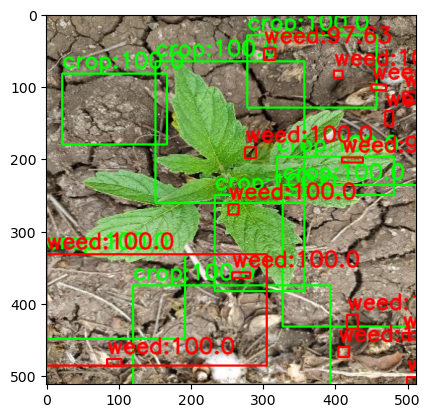

In [25]:
detection(images_path+images_name[500])

0it [00:00, ?it/s]

[[[0, 0, 170, 185], 0.9999998999999635, 'crop'],
 [[269, 232, 173, 122], 0.9999998999999635, 'crop'],
 [[213, 298, 112, 200], 0.9999998999999635, 'crop'],
 [[367, 382, 145, 130], 0.9999998999999635, 'crop'],
 [[0, 124, 257, 388], 0.9999998999999635, 'crop'],
 [[202, 72, 152, 188], 0.9999998999999635, 'crop'],
 [[318, 29, 194, 202], 0.9999998999999635, 'crop'],
 [[267, 178, 245, 219], 0.9999999999999463, 'weed'],
 [[95, 0, 185, 140], 0.9999999999999463, 'weed'],
 [[498, 498, 14, 14], 0.9999999999999463, 'weed'],
 [[454, 457, 16, 18], 0.9999999999999463, 'weed'],
 [[482, 166, 30, 21], 0.9999999999999463, 'weed'],
 [[334, 364, 164, 148], 0.9999999999999463, 'weed'],
 [[129, 159, 134, 127], 0.9999999999999463, 'weed'],
 [[488, 300, 24, 23], 0.9999999999999463, 'weed'],
 [[0, 185, 166, 234], 0.9999999999999463, 'weed'],
 [[392, 14, 21, 10], 0.9970746007297182, 'weed']]

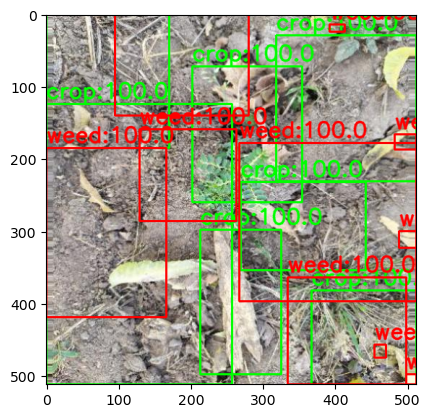

In [26]:
detection(images_path+images_name[24])

0it [00:00, ?it/s]

[[[318, 146, 194, 184], 0.9999998999999635, 'crop'],
 [[0, 132, 358, 258], 0.9999998999999635, 'crop'],
 [[62, 0, 213, 120], 0.9999998999999635, 'crop'],
 [[252, 342, 260, 170], 0.9999998999999635, 'crop'],
 [[29, 339, 199, 151], 0.9999998999999635, 'crop'],
 [[324, 306, 188, 206], 0.99999999999995, 'weed'],
 [[247, 327, 27, 13], 0.9999999999999463, 'weed'],
 [[337, 188, 26, 9], 0.9999999999999463, 'weed'],
 [[306, 108, 17, 21], 0.9999999999999463, 'weed'],
 [[218, 130, 21, 21], 0.9999999999999463, 'weed'],
 [[0, 0, 247, 146], 0.9999999999999463, 'weed'],
 [[62, 218, 18, 14], 0.9999999999999463, 'weed'],
 [[271, 430, 18, 12], 0.9999999999999463, 'weed'],
 [[318, 400, 19, 11], 0.9999999999999463, 'weed'],
 [[182, 284, 27, 13], 0.9999999999999463, 'weed'],
 [[58, 189, 24, 13], 0.9999999999999463, 'weed'],
 [[484, 327, 24, 10], 0.9999999999999463, 'weed'],
 [[267, 297, 22, 12], 0.9999999999999463, 'weed'],
 [[286, 403, 9, 23], 0.9999999999999463, 'weed'],
 [[419, 501, 13, 11], 0.999999999

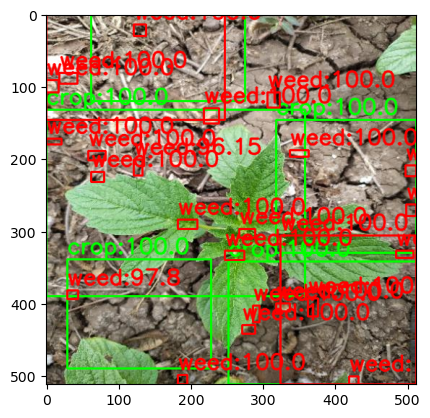

In [27]:
detection(images_path+images_name[1100])